In [ ]:
from torchvision import datasets, transforms
from torchvision import models

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset

from torchsummary import summary

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import precision_score, recall_score, f1_score

import glob # for wild card when image_name selection
import time
from PIL import Image
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


### Data Structure for Dataset

In [3]:

transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize to match ResNet input size
    transforms.ToTensor(),          # Convert to tensor
])

# Custom dataset class
class MothDataset(Dataset):
    def __init__(self, csv_file, root_dir, transform=None):
        self.data_frame = pd.read_csv(csv_file)
        self.root_dir = root_dir
        self.transform = transform

        self.label_encoder = LabelEncoder()
        self.data_frame['scientificName_encoded'] = self.label_encoder.fit_transform(self.data_frame['scientificName'])

    def __len__(self):
        return len(self.data_frame)

    def __getitem__(self, idx):
        #img_name = os.path.join(self.root_dir, self.data_frame.iloc[idx, 0])  # Assuming the first column is the ID
        img_name = glob.glob(os.path.join(self.root_dir, f"{self.data_frame.iloc[idx, 0]}_*.jpg"))[0]

        image = Image.open(img_name).convert("RGB")
        label = self.data_frame.iloc[idx, 2]  # the idx 2 column contains the scientificName_encoded

        if self.transform:
            image = self.transform(image)

        label_tensor = torch.tensor(label, dtype=torch.long)

        return image, label_tensor
        
    def decode_label(self, encoded_label):
        '''Helper Function to display the type of moth, reversing label encoder.'''
        return self.label_encoder.inverse_transform([encoded_label])[0]

    def get_gbifid(self, idx):
        return self.data_frame.iloc[idx, 0]

    def get_index(self, image):
        '''Helper Function to search for index of an image (relevant for finding the gbifID)'''
        for idx in range(len(self)):
            sample_image, _ = self[idx]
            if torch.equal(sample_image, image):
                return idx
        return None  # If no matching image is found


### Load dataset from folder into the MothDataset class and save to file

In [4]:

path_to_processed = '../data/processed/'
testing_dataset_csv_path = path_to_processed + 'testing_dataset.csv'
testing_dataset_image_path = path_to_processed + 'testing_dataset'

# Load your full dataset
full_dataset = MothDataset(csv_file=testing_dataset_csv_path, root_dir=testing_dataset_image_path, transform=transform)


# Split the dataset into train, test and validation 
# torch.save(dataset, '1000M_20S_dataset.pth')



### Load and split the data into training, validation and testing shares

In [5]:
# Load the dataset
#full_dataset = torch.load('1000M_20S_dataset.pth')

train_val_indices, test_indices = train_test_split(range(len(full_dataset)), test_size=0.15, random_state=42)
train_val_dataset = torch.utils.data.Subset(full_dataset, train_val_indices)

train_indices, val_indices = train_test_split(range(len(train_val_dataset)), test_size=0.1764, random_state=42)

train_dataset = torch.utils.data.Subset(full_dataset, train_indices)
val_dataset = torch.utils.data.Subset(full_dataset, val_indices)
test_dataset = torch.utils.data.Subset(full_dataset, test_indices)

### Prepare DataLoaders

In [6]:

batch_size = 25

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

print(f"Amount of batches in Train Loader: {len(train_loader)}")
print(f"Amount of batches in Validation Loader: {len(val_loader)}")
print(f"Amount of batches in Testing Loader: {len(test_loader)}")


Amount of batches in Train Loader: 28
Amount of batches in Validation Loader: 6
Amount of batches in Testing Loader: 6


### Helper Function to plot and display data or samples

In [7]:
def plot_loss(train_loss, val_loss):
    plt.figure(figsize=(10, 5))
    plt.plot(train_loss, label='Training Loss')
    plt.plot(val_loss, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('Training and Validation Loss Curve')
    plt.show()

def show_sample(image, label, predicted=None, show_gbifid=False):
    image_gbifid = ""
    if show_gbifid:
        index = full_dataset.get_index(image)
        image_gbifid = full_dataset.get_gbifid(index) if index is not None else "Unknown ID"
    image = image.numpy().transpose((1, 2, 0))
    plt.imshow(image)
    if not predicted:
        plt.title(f'{image_gbifid}{label} | {full_dataset.decode_label(label)} | {image.shape}')
    else:
        plt.title(f'{image_gbifid}{label}-{full_dataset.decode_label(label)}, NOT {predicted}-{full_dataset.decode_label(predicted)}')

    plt.pause(0.001)


### Initialization of Model and according parameters

In [8]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [9]:
num_moth_species = 20

pretrained_resnet50 = models.resnet50(weights=models.ResNet50_Weights.DEFAULT)

#pretrained_resnet50.fc = nn.Linear(pretrained_resnet50.fc.in_features, num_moth_species) # reshape fully connected layer to match moth classification

pretrained_resnet50.fc = nn.Sequential(
    nn.Linear(pretrained_resnet50.fc.in_features, 512),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(512, num_moth_species) # try also 1024, 256, 128?
)


pretrained_resnet50 = pretrained_resnet50.to(device)

for name, param in pretrained_resnet50.named_parameters(): # freeze all but last layer

    if "fc" not in name: 
        param.requires_grad = False

optimizer = optim.Adam(pretrained_resnet50.fc.parameters(), lr=0.001) # Train only the final layer
criterion = nn.CrossEntropyLoss() # Loss function to measure distance between prediction and reality

# TODO: freezing fewer layers / adding layers at the end?
# different learning rates for different layers? (earlier layer, lower learning rate?)

In [10]:
summary(pretrained_resnet50, input_size=(3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]           4,096
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]          36,864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]          16,384
      BatchNorm2d-12          [-1, 256, 56, 56]             512
           Conv2d-13          [-1, 256, 56, 56]          16,384
      BatchNorm2d-14          [-1, 256,

### Training and Validation

Epoch [1/5], Training Loss: 2.6270
[Batch 1] 25 Images | 25 Labels
[Batch 2] 25 Images | 25 Labels
[Batch 3] 25 Images | 25 Labels
[Batch 4] 25 Images | 25 Labels
[Batch 5] 25 Images | 25 Labels
[Batch 6] 25 Images | 25 Labels
Precision: 0.6755, Recall: 0.4800, F1-Score: 0.4495,  Validation Accuracy: 48.00% (72/150), Validation Loss: 2.2228
Duration: 65.7s

Epoch [2/5], Training Loss: 1.7671
[Batch 1] 25 Images | 25 Labels
[Batch 2] 25 Images | 25 Labels
[Batch 3] 25 Images | 25 Labels
[Batch 4] 25 Images | 25 Labels
[Batch 5] 25 Images | 25 Labels
[Batch 6] 25 Images | 25 Labels
Precision: 0.5893, Recall: 0.5533, F1-Score: 0.5375,  Validation Accuracy: 55.33% (83/150), Validation Loss: 1.6369
Duration: 63.3s

Epoch [3/5], Training Loss: 1.1831
[Batch 1] 25 Images | 25 Labels
[Batch 2] 25 Images | 25 Labels
[Batch 3] 25 Images | 25 Labels
[Batch 4] 25 Images | 25 Labels
[Batch 5] 25 Images | 25 Labels
[Batch 6] 25 Images | 25 Labels
Precision: 0.6717, Recall: 0.6267, F1-Score: 0.6206, 

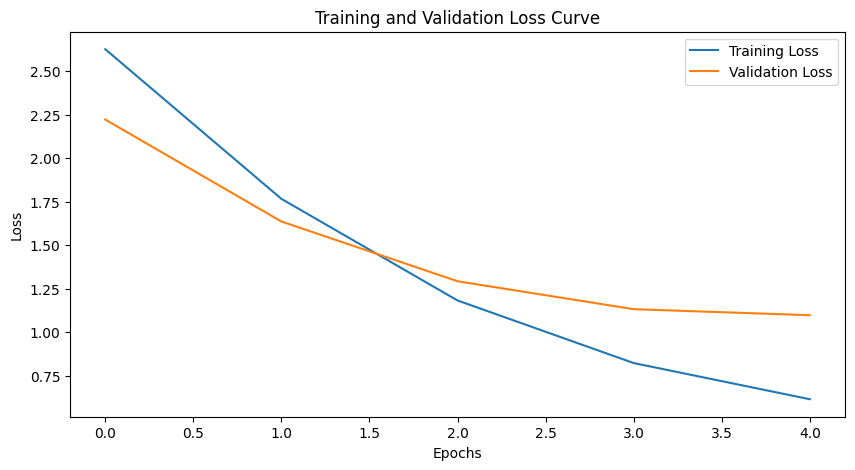

In [11]:
# Training loop

train_loss = [] 
val_loss = [] 

num_epochs = 5
for epoch in range(num_epochs):
    start_time = time.perf_counter()
    running_loss = 0.0
    
    pretrained_resnet50.train()  # Set model to training mode
    # i = 0
    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)

        # i+=1
        # print(f'[Batch {i}] {len(images)} Images | {len(labels)} Labels')

        optimizer.zero_grad() # clearing gradients for new batch
        outputs = pretrained_resnet50(images) # predict species for given batch
        loss = criterion(outputs, labels) # measure distance between prediction and reality
        loss.backward() # propagate back and calculate gradients
        optimizer.step() # adjust weights

        running_loss += loss.item()
    train_loss.append(running_loss/len(train_loader))
    print(f'Epoch [{epoch+1}/{num_epochs}], Training Loss: {running_loss/len(train_loader):.4f}')
    
    # Validate the model
    running_loss = 0.0
    pretrained_resnet50.eval()  # Set model to evaluation mode
    with torch.no_grad(): # to not update the weights (preventing leaks)
        total = 0
        correct = 0
        all_labels = []
        all_preds = []
        i = 0

        for images, labels in val_loader:
            i += 1
            images, labels = images.to(device), labels.to(device)
            outputs = pretrained_resnet50(images)            
            _, predicted = torch.max(outputs.data, 1) # select indices of classes with highest probability, in _ the actual class is stored
            total += labels.size(0) # collects amount of samples processed
            correct += (predicted == labels).sum().item()

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(predicted.cpu().numpy())
            loss = criterion(outputs, labels)
            running_loss += loss.item()
            print(f'[Batch {i}] {len(images)} Images | {len(labels)} Labels')
        val_loss.append(running_loss/len(val_loader))
    
    precision = precision_score(all_labels, all_preds, average='weighted', zero_division=1)
    recall = recall_score(all_labels, all_preds, average='weighted')
    f1 = f1_score(all_labels, all_preds, average='weighted')
    
    print(f'Precision: {precision:.4f}, Recall: {recall:.4f}, F1-Score: {f1:.4f},  Validation Accuracy: {100 * correct / total:.2f}% ({correct}/{total}), Validation Loss: {running_loss/len(val_loader):.4f}')

    print(f'Duration: {time.perf_counter() - start_time:.1f}s')
    print()

plot_loss(train_loss, val_loss)

### Final testing of the model and quality assurance

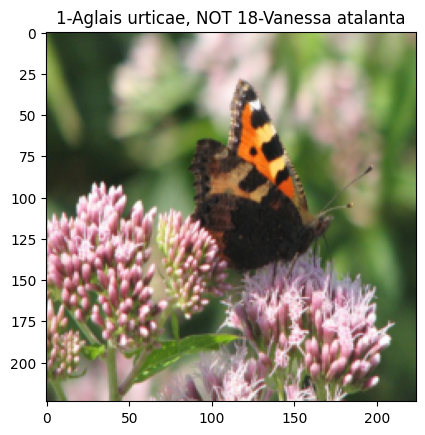

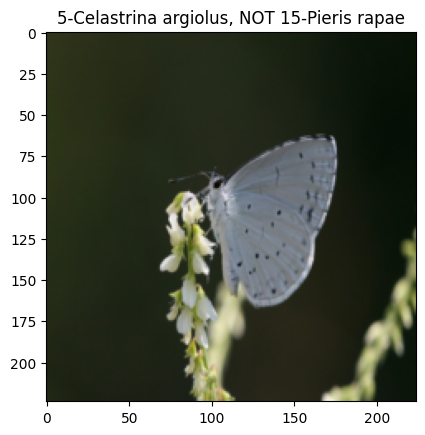

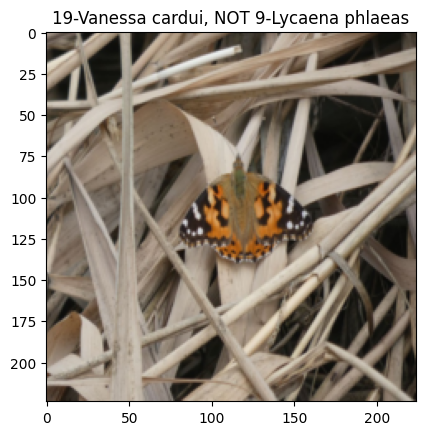

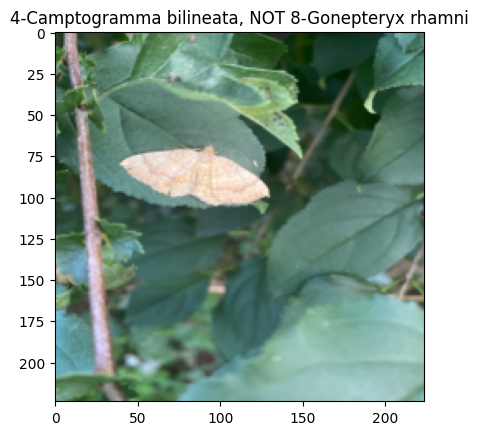

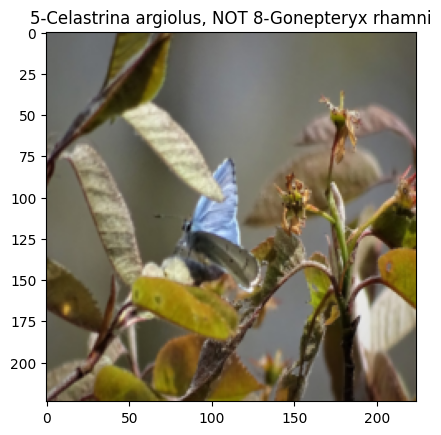

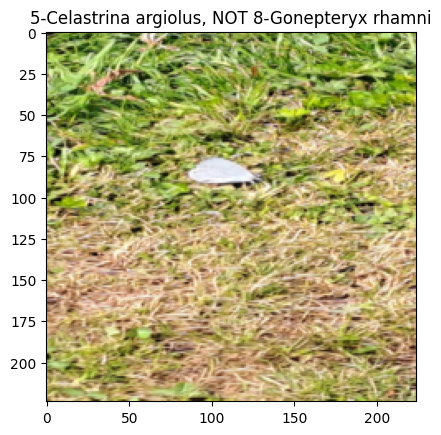

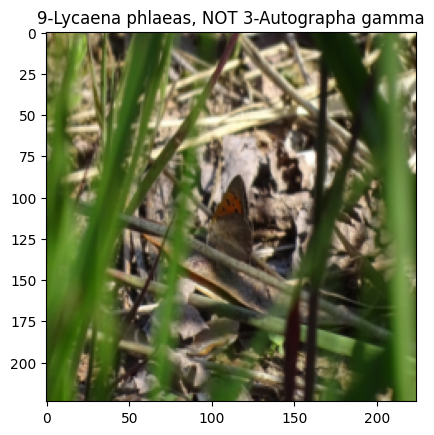

7 wrongly predicted images with indices [3, 8, 13, 14, 15, 17, 24]
[Batch 1] 25 Images | 25 Labels



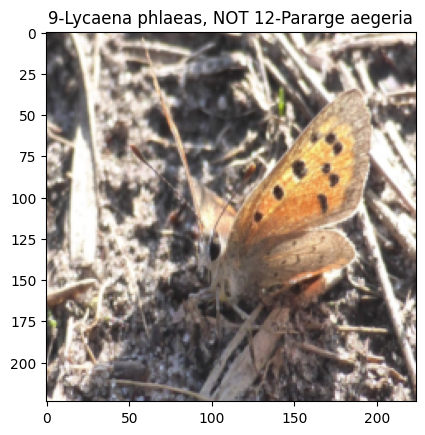

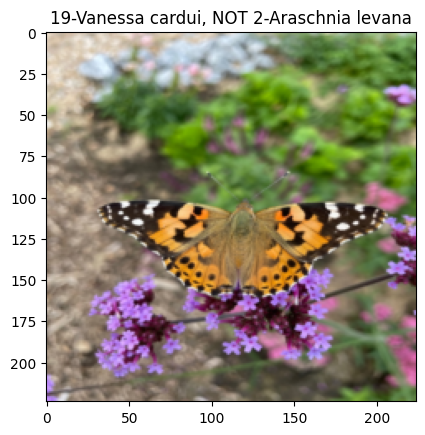

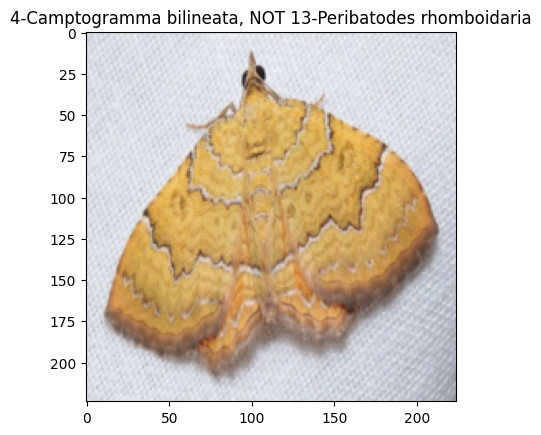

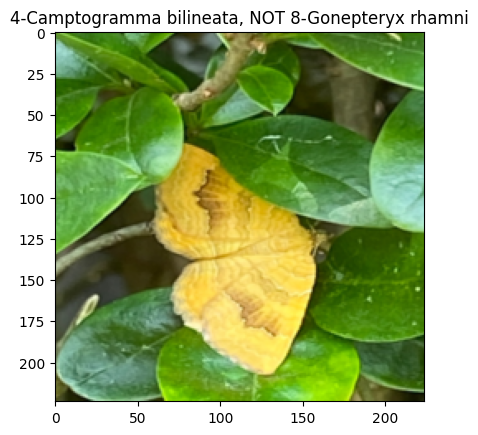

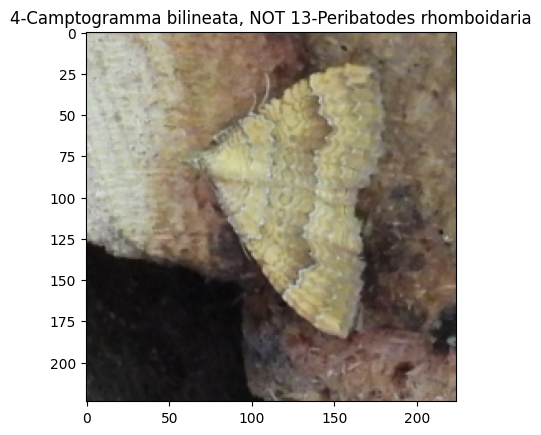

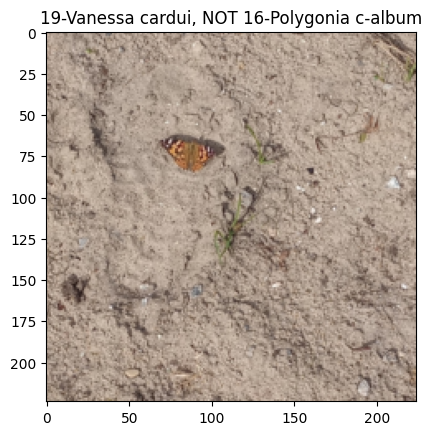

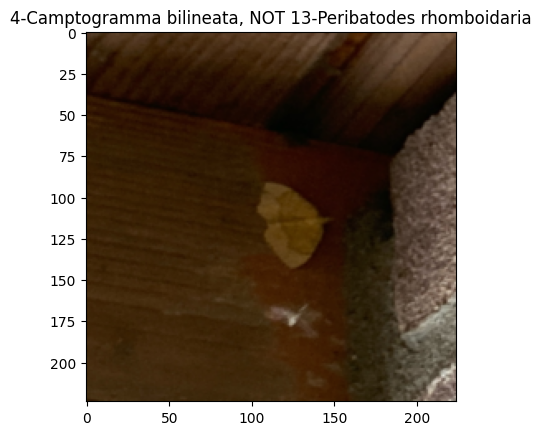

7 wrongly predicted images with indices [0, 2, 3, 4, 13, 18, 21]
[Batch 2] 25 Images | 25 Labels



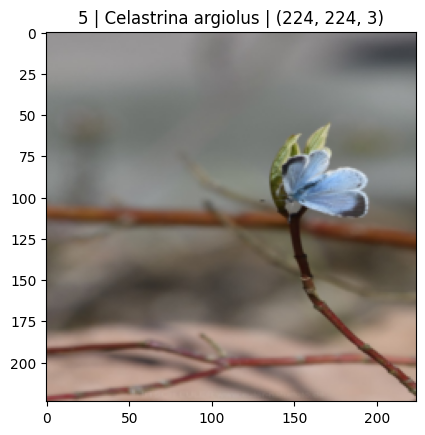

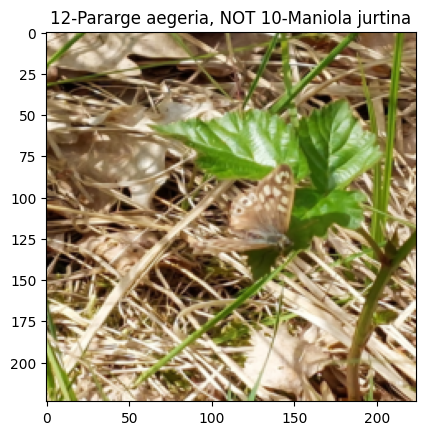

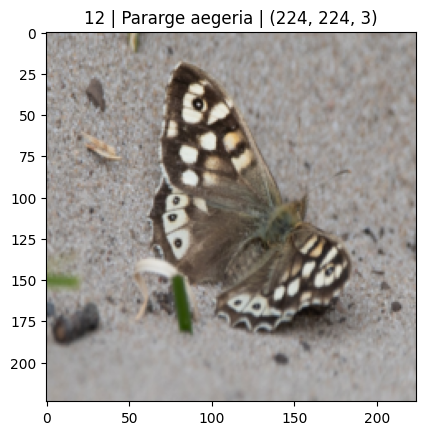

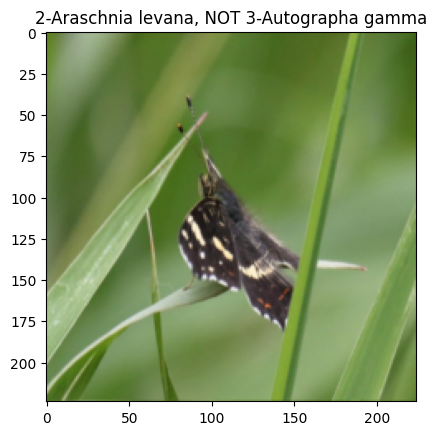

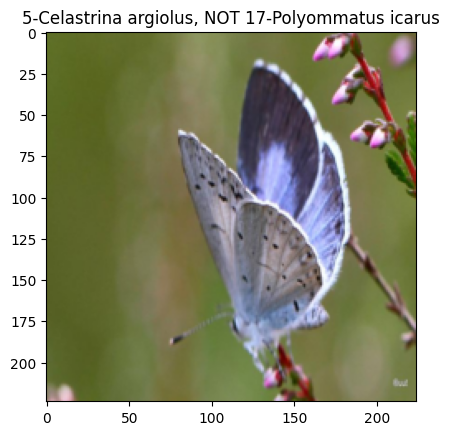

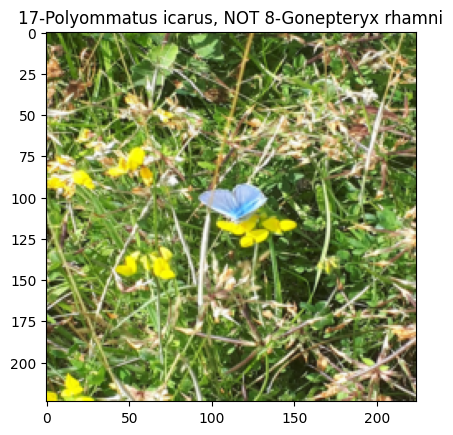

6 wrongly predicted images with indices [1, 5, 7, 9, 17, 24]
[Batch 3] 25 Images | 25 Labels



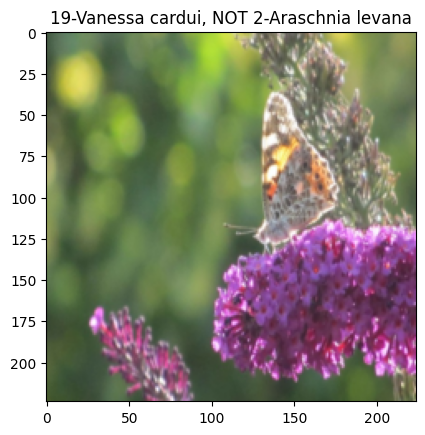

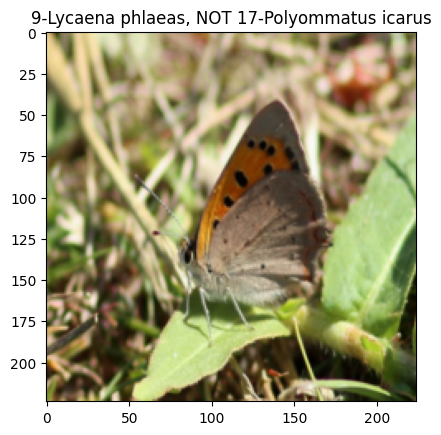

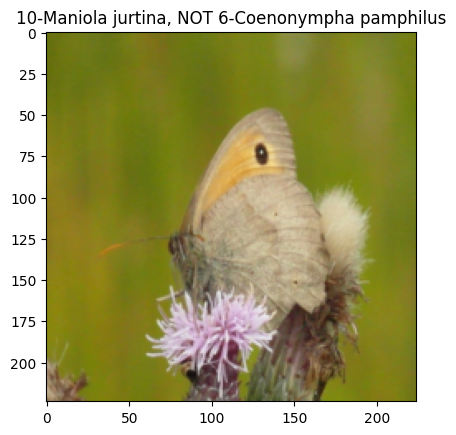

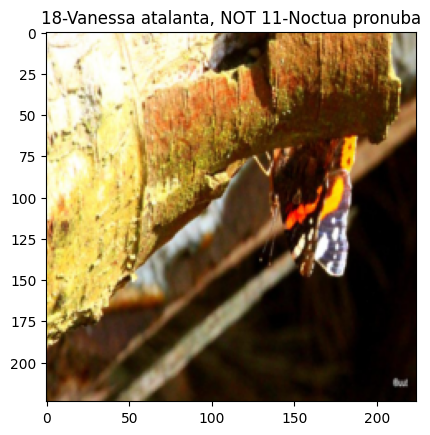

4 wrongly predicted images with indices [11, 18, 20, 23]
[Batch 4] 25 Images | 25 Labels



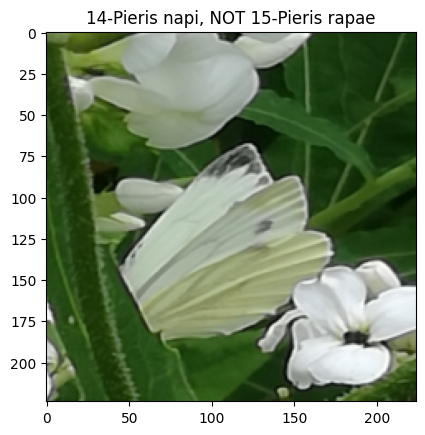

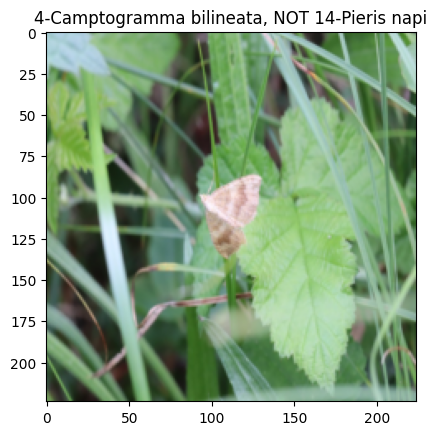

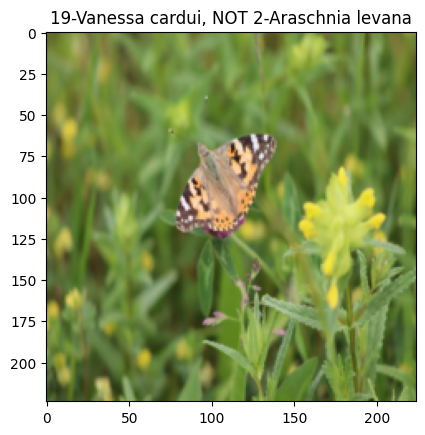

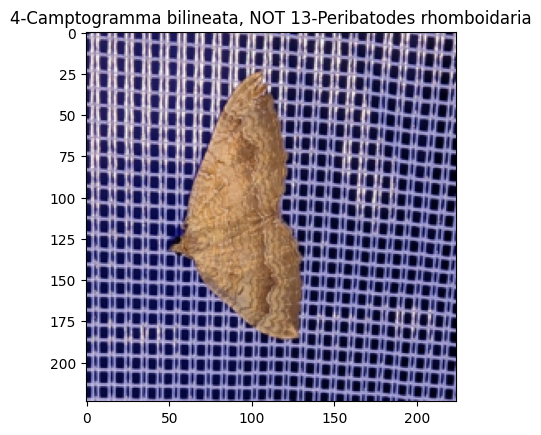

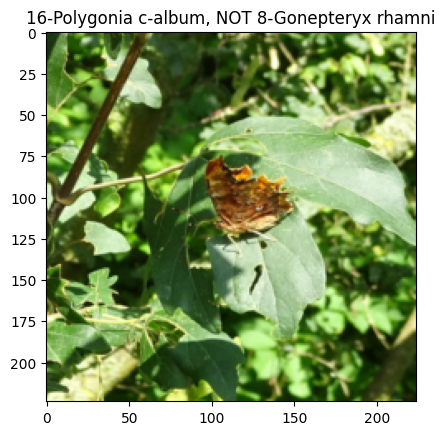

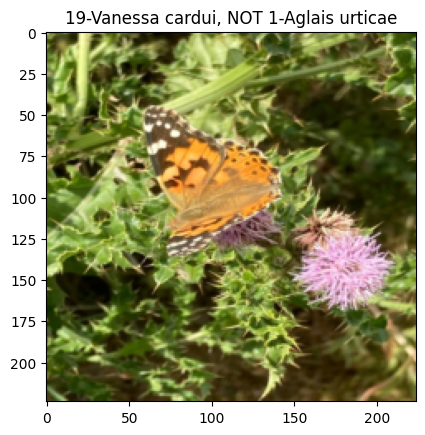

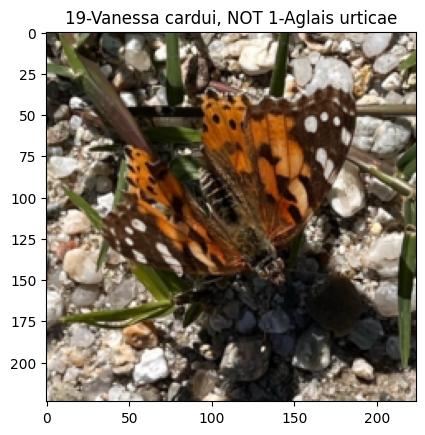

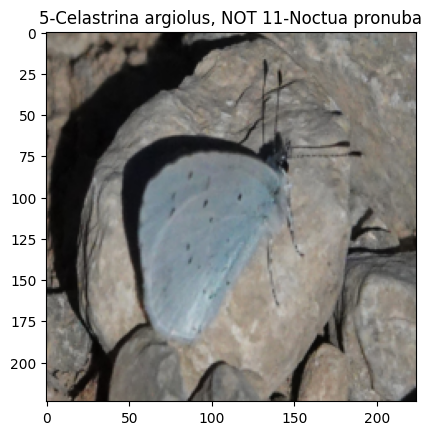

8 wrongly predicted images with indices [1, 2, 7, 9, 10, 12, 17, 20]
[Batch 5] 25 Images | 25 Labels



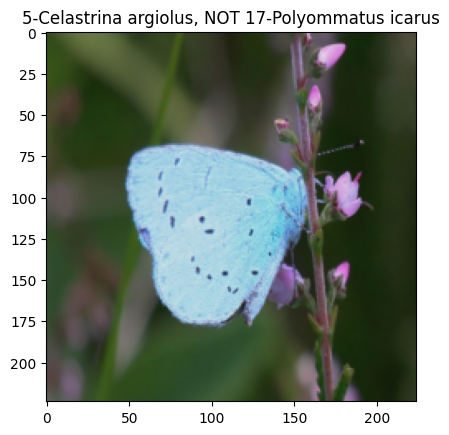

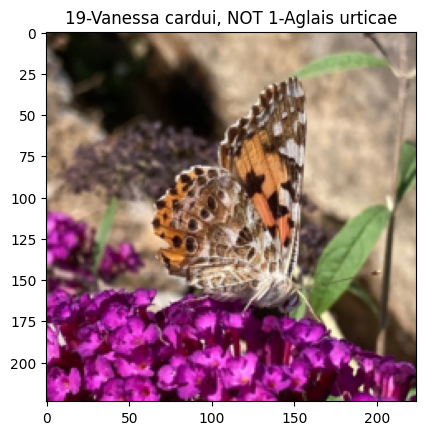

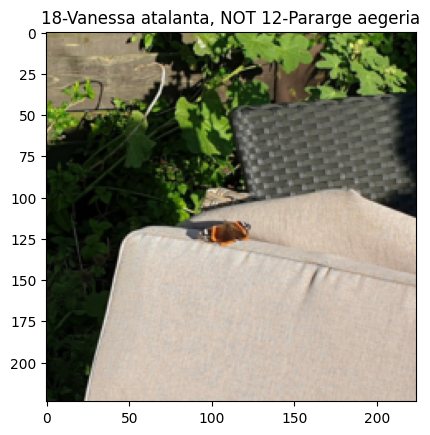

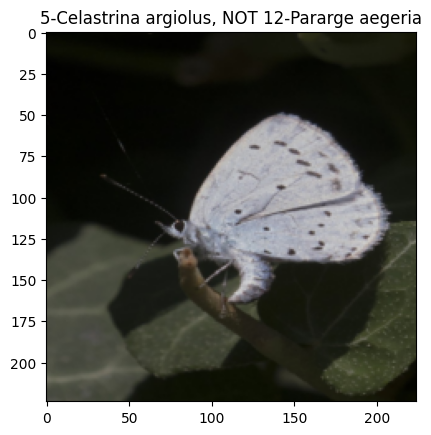

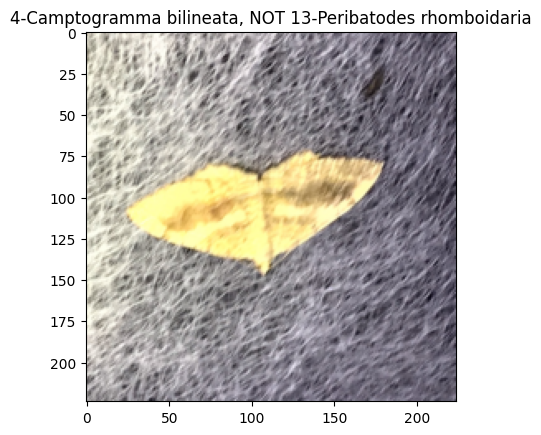

5 wrongly predicted images with indices [3, 8, 14, 19, 20]
[Batch 6] 25 Images | 25 Labels

Precision: 0.8181, Recall: 0.7533, F1-Score: 0.6938, Mean Accuracy: 75.33% (113/150)


In [12]:
pretrained_resnet50.eval()  # Set model to evaluation mode
with torch.no_grad(): # to not update the weights (preventing leaks)
    total = 0
    correct = 0
    all_labels = []
    all_preds = []
    i = 0
    for images, labels in test_loader:
        i +=1
        images, labels = images.to(device), labels.to(device)
        outputs = pretrained_resnet50(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

        # display wrongly predicted samples:
        false_prediction_indices = ((predicted == labels) == False).nonzero(as_tuple=False).squeeze().tolist()

        if True:
            for index in false_prediction_indices:
                show_sample(images[index], labels[index], predicted[index], False)

        all_labels.extend(labels.cpu().numpy())
        all_preds.extend(predicted.cpu().numpy())
        print(f'{len(false_prediction_indices)} wrongly predicted images with indices {false_prediction_indices}')
        print(f'[Batch {i}] {len(images)} Images | {len(labels)} Labels')
        print()

precision = precision_score(all_labels, all_preds, average='weighted', zero_division=1)
recall = recall_score(all_labels, all_preds, average='weighted')
f1 = f1_score(all_labels, all_preds, average='weighted')

print(f'Precision: {precision:.4f}, Recall: {recall:.4f}, F1-Score: {f1:.4f}, Mean Accuracy: {100*correct/total:.2f}% ({correct}/{total})')

### Further steps:
- [ ] fine-tune learning rate
- [ ] derive testing data set for completely unseen data!
- [ ] stratified k-fold